## Testing Trained Models on sample images

In [ ]:
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

Mounted at /gdrive


In [3]:
!unzip /content/drive/MyDrive/models

Archive:  /content/drive/MyDrive/models.zip
  inflating: plant_village_EfficientNetB0_colab.h5  
  inflating: plant_village_ResNet101V2_kaggle.h5  
  inflating: plant_village_MobileNetV2_colab.h5  
  inflating: plant_village_InceptionV3_kaggle.h5  
  inflating: plant_village_vgg_16_colab.h5  
  inflating: plant_village_InceptionResNetV2_kaggle.h5  


In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.models import load_model

Loading Models

In [5]:
vgg16 = load_model('/content/plant_village_vgg_16_colab.h5')
ResNet101V2 = load_model('/content/plant_village_ResNet101V2_kaggle.h5')
MobileNetV2 = load_model('/content/plant_village_MobileNetV2_colab.h5')
InceptionV3 = load_model('/content/plant_village_InceptionV3_kaggle.h5')
InceptionResNetV2 = load_model('/content/plant_village_InceptionResNetV2_kaggle.h5')

In [6]:
class_names = {0: 'Apple___Apple_scab',
 1: 'Apple___Black_rot',
 2: 'Apple___Cedar_apple_rust',
 3: 'Apple___healthy',
 4: 'Background_without_leaves',
 5: 'Blueberry___healthy',
 6: 'Cherry___Powdery_mildew',
 7: 'Cherry___healthy',
 8: 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
 9: 'Corn___Common_rust',
 10: 'Corn___Northern_Leaf_Blight',
 11: 'Corn___healthy',
 12: 'Grape___Black_rot',
 13: 'Grape___Esca_(Black_Measles)',
 14: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 15: 'Grape___healthy',
 16: 'Orange___Haunglongbing_(Citrus_greening)',
 17: 'Peach___Bacterial_spot',
 18: 'Peach___healthy',
 19: 'Pepper,_bell___Bacterial_spot',
 20: 'Pepper,_bell___healthy',
 21: 'Potato___Early_blight',
 22: 'Potato___Late_blight',
 23: 'Potato___healthy',
 24: 'Raspberry___healthy',
 25: 'Soybean___healthy',
 26: 'Squash___Powdery_mildew',
 27: 'Strawberry___Leaf_scorch',
 28: 'Strawberry___healthy',
 29: 'Tomato___Bacterial_spot',
 30: 'Tomato___Early_blight',
 31: 'Tomato___Late_blight',
 32: 'Tomato___Leaf_Mold',
 33: 'Tomato___Septoria_leaf_spot',
 34: 'Tomato___Spider_mites Two-spotted_spider_mite',
 35: 'Tomato___Target_Spot',
 36: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 37: 'Tomato___Tomato_mosaic_virus',
 38: 'Tomato___healthy'}

Preprocessing and Predciting Test Images

Found 0 images belonging to 0 classes.
1/1 [==============================] - 0s 86ms/step


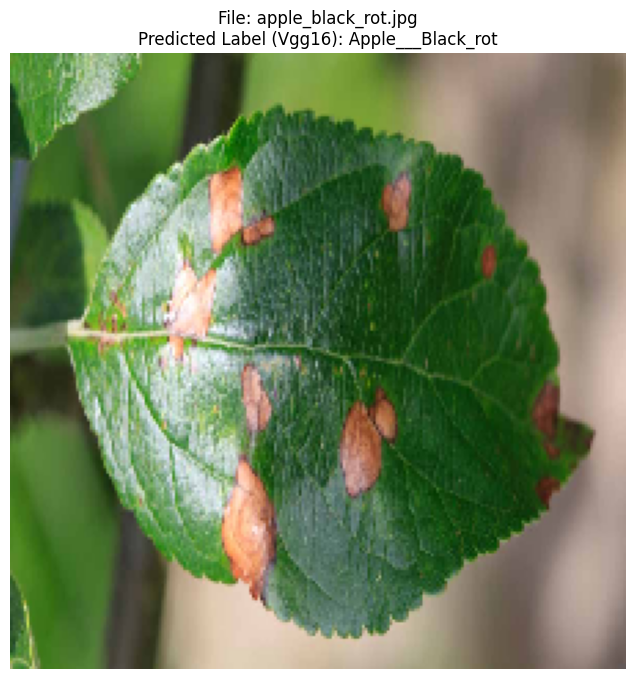

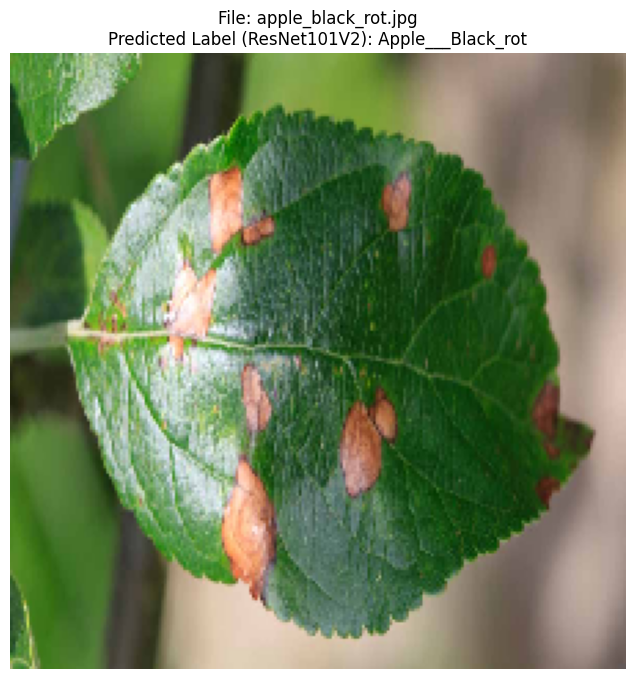

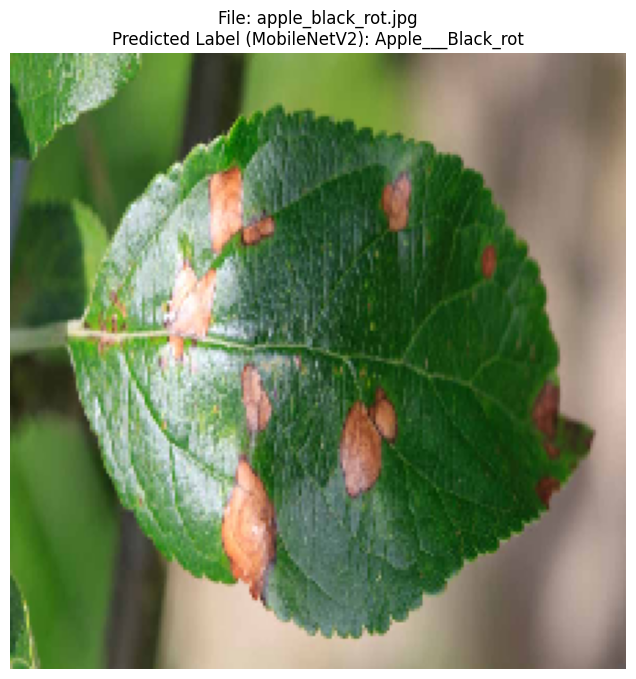

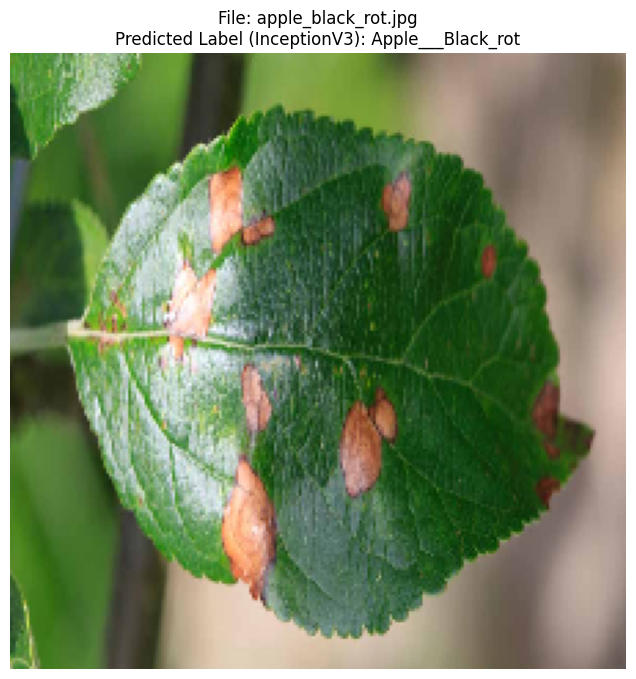

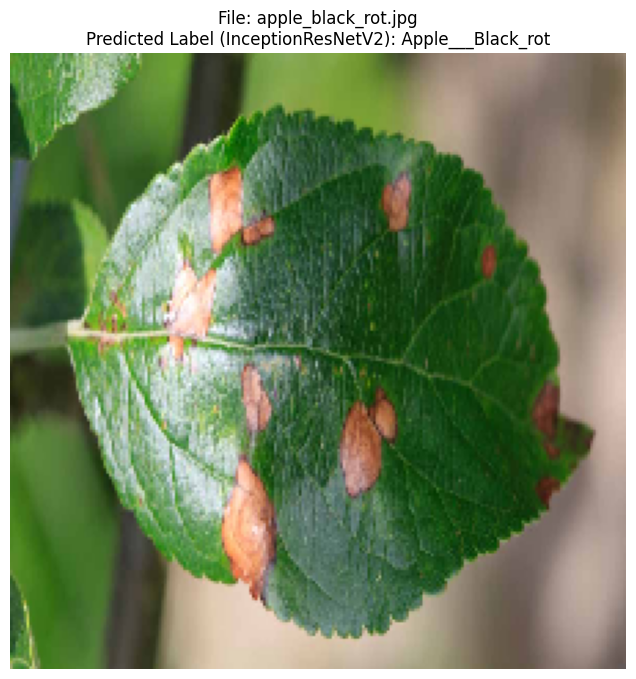

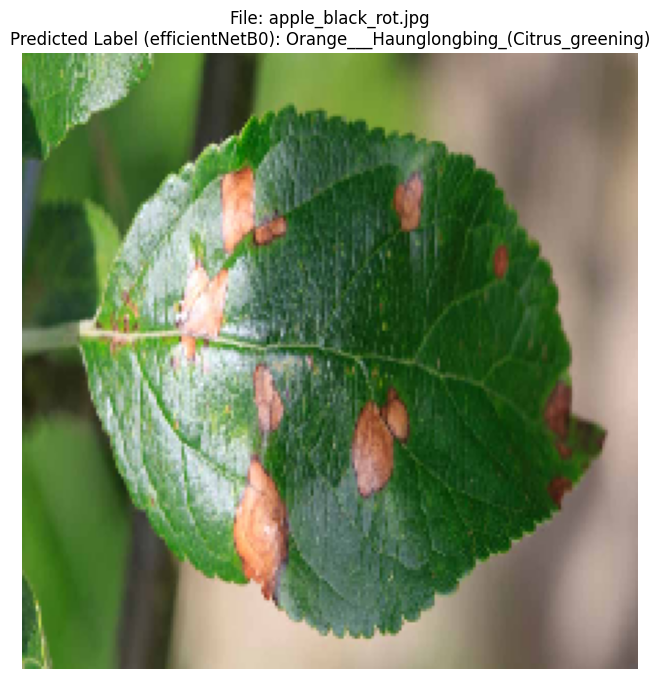

File: apple_black_rot.jpg, Predicted Label (Vgg16): 1
File: apple_black_rot.jpg, Predicted Label (ResNet101V2): 1
File: apple_black_rot.jpg, Predicted Label (MobileNetV2): 1
File: apple_black_rot.jpg, Predicted Label (InceptionV3): 1
File: apple_black_rot.jpg, Predicted Label (InceptionResNetV2): 1
File: apple_black_rot.jpg, Predicted Label (efficientNetB0): 16
1/1 [==============================] - 0s 106ms/step


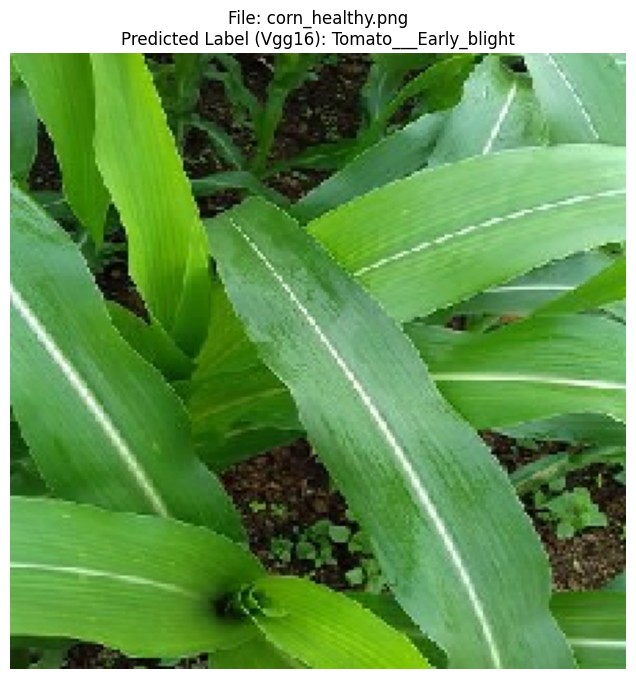

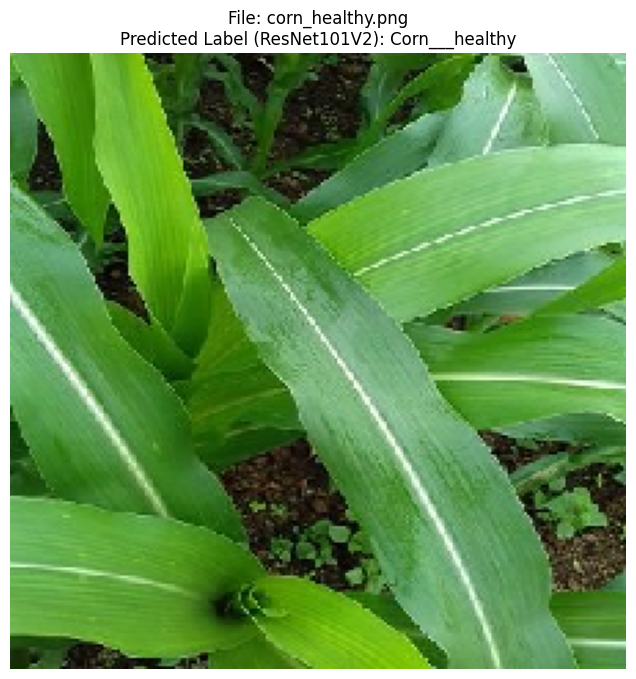

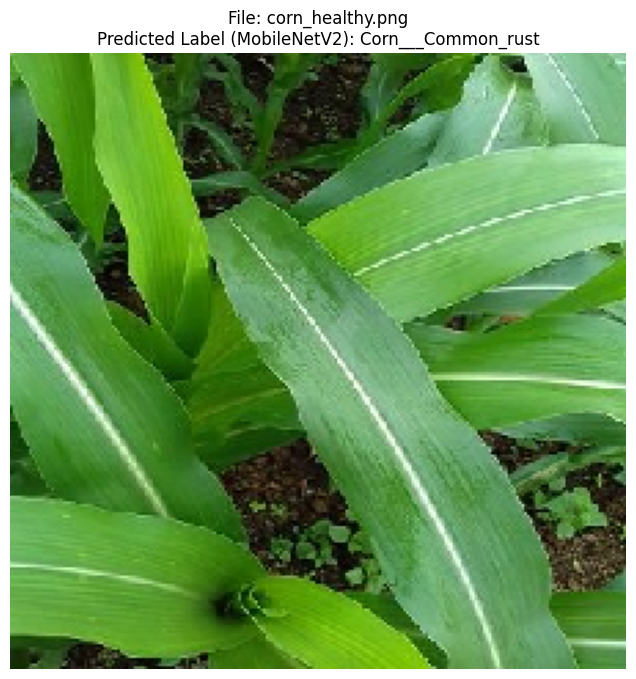

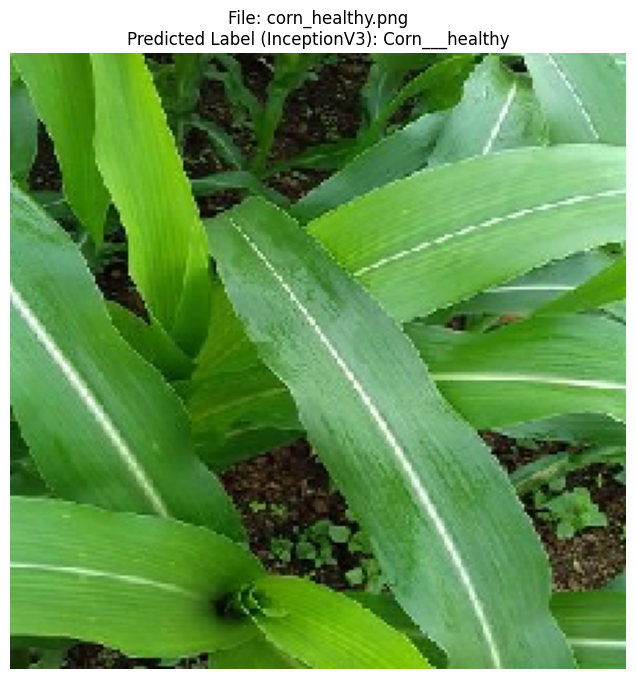

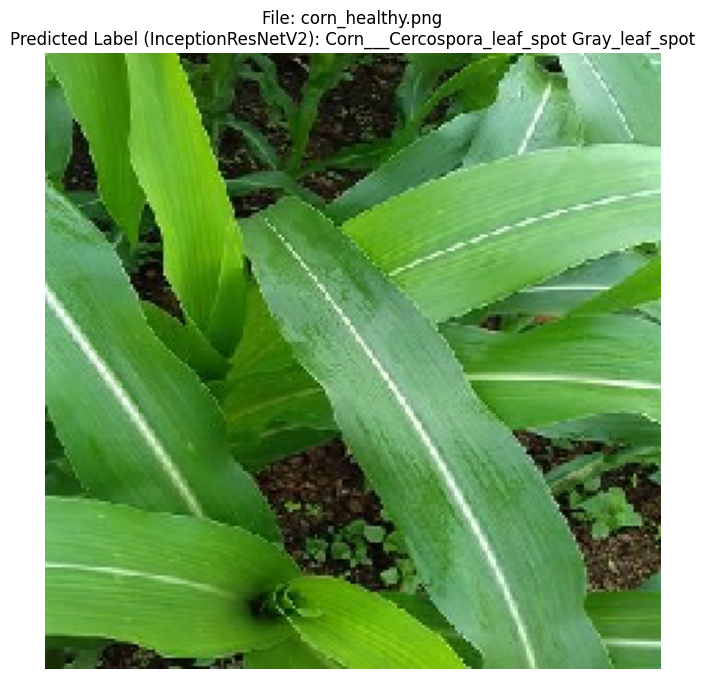

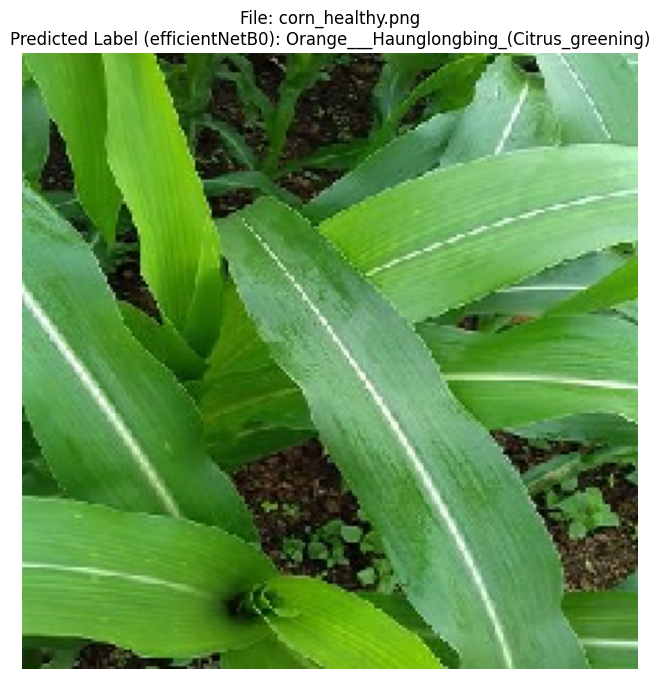

File: corn_healthy.png, Predicted Label (Vgg16): 30
File: corn_healthy.png, Predicted Label (ResNet101V2): 11
File: corn_healthy.png, Predicted Label (MobileNetV2): 9
File: corn_healthy.png, Predicted Label (InceptionV3): 11
File: corn_healthy.png, Predicted Label (InceptionResNetV2): 8
File: corn_healthy.png, Predicted Label (efficientNetB0): 16
1/1 [==============================] - 0s 212ms/step


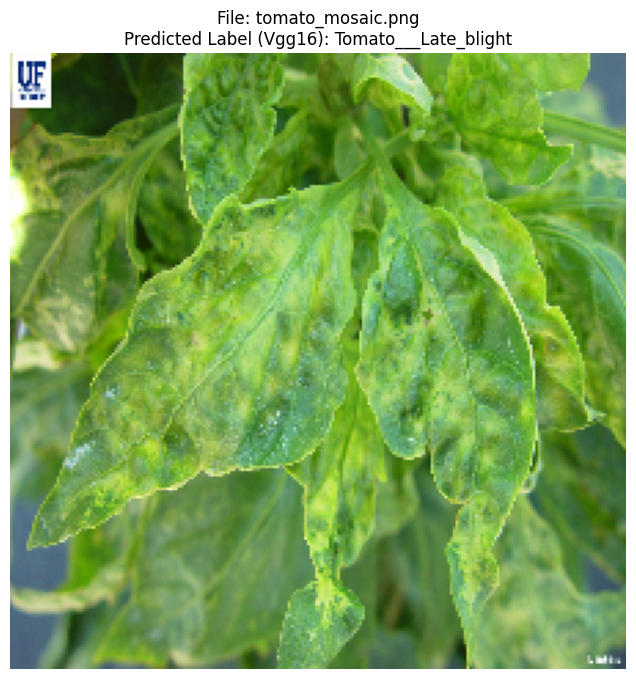

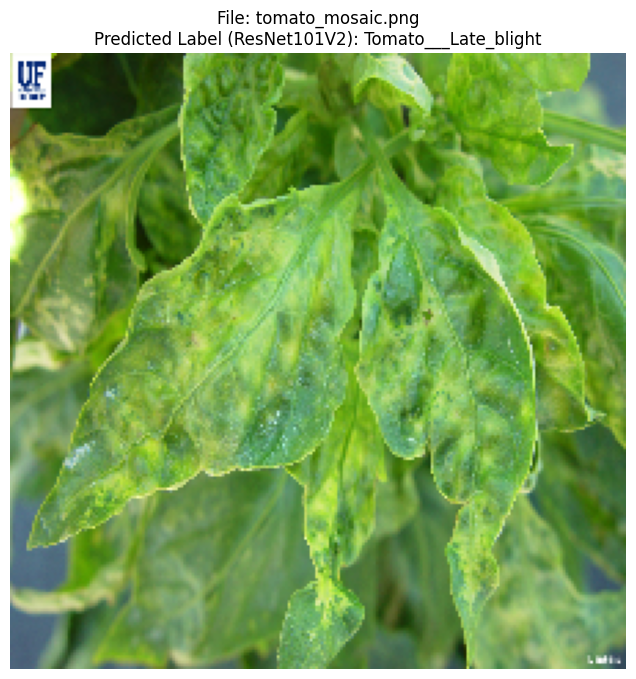

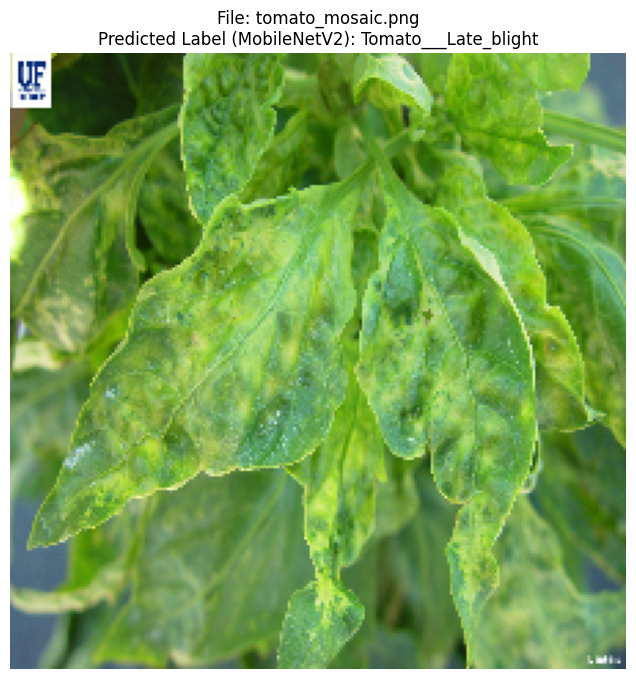

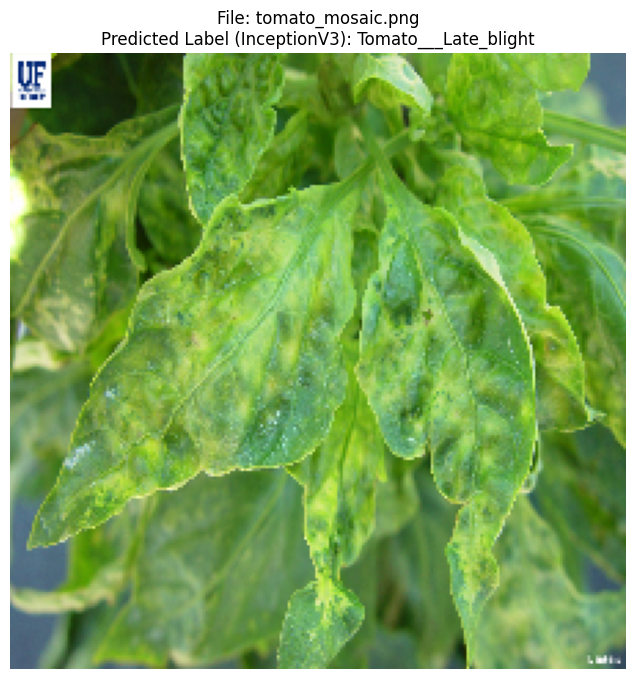

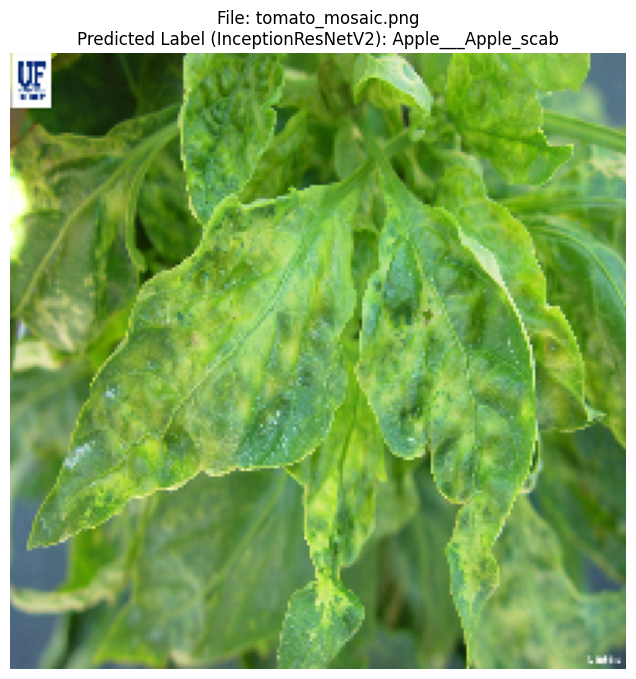

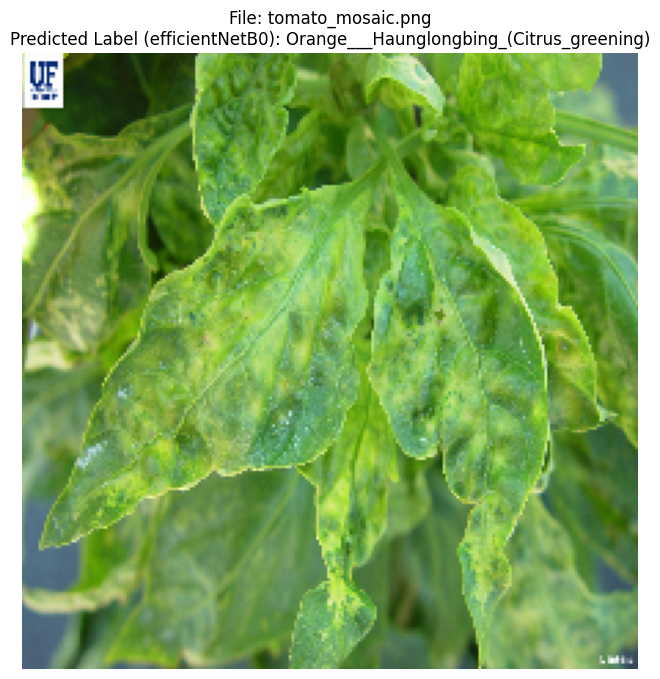

File: tomato_mosaic.png, Predicted Label (Vgg16): 31
File: tomato_mosaic.png, Predicted Label (ResNet101V2): 31
File: tomato_mosaic.png, Predicted Label (MobileNetV2): 31
File: tomato_mosaic.png, Predicted Label (InceptionV3): 31
File: tomato_mosaic.png, Predicted Label (InceptionResNetV2): 0
File: tomato_mosaic.png, Predicted Label (efficientNetB0): 16
1/1 [==============================] - 0s 149ms/step


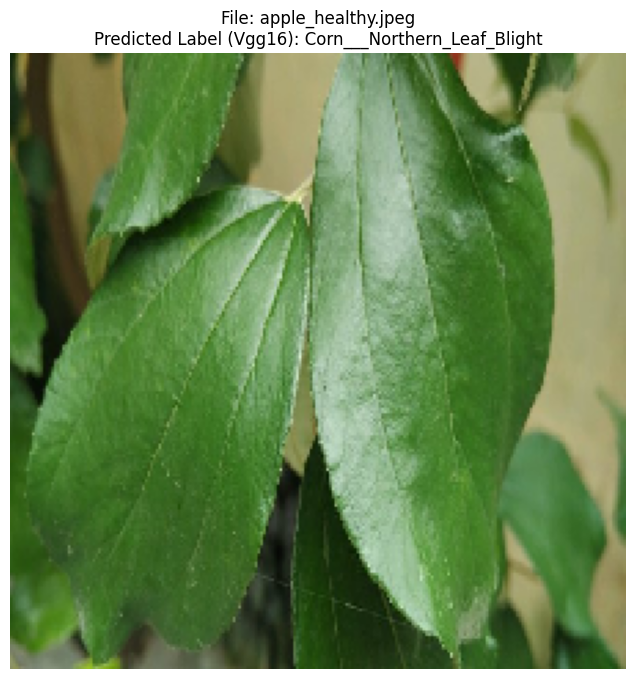

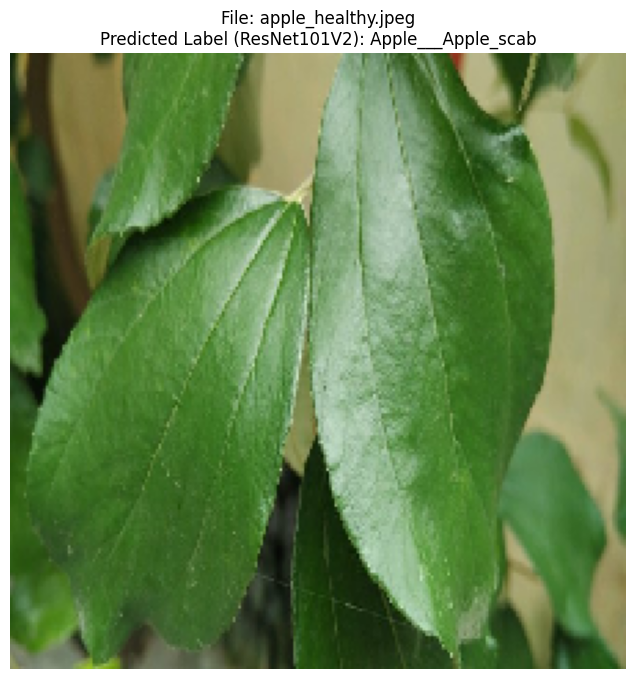

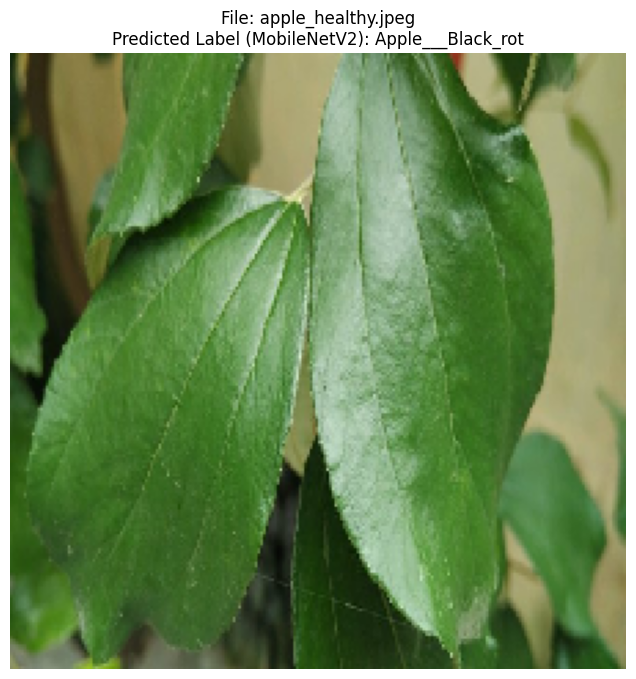

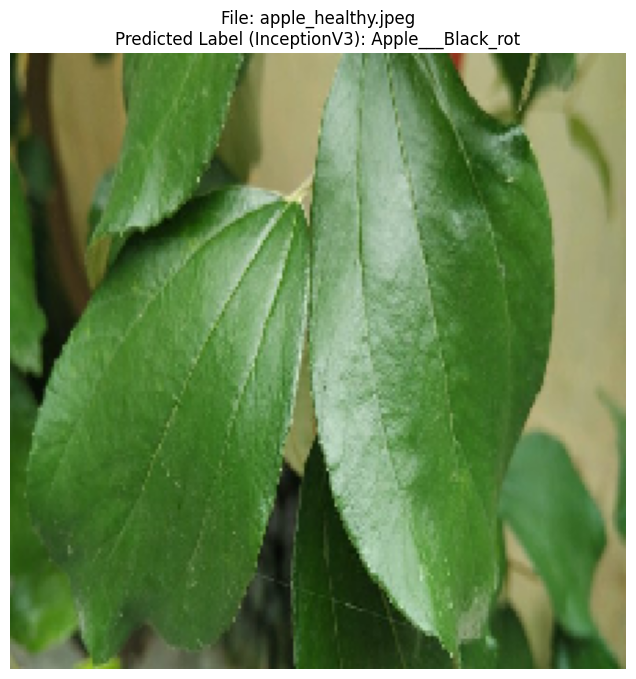

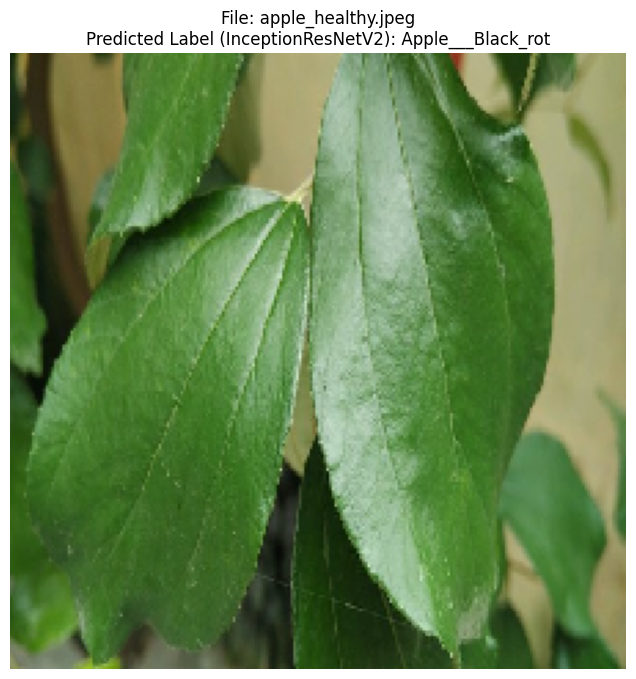

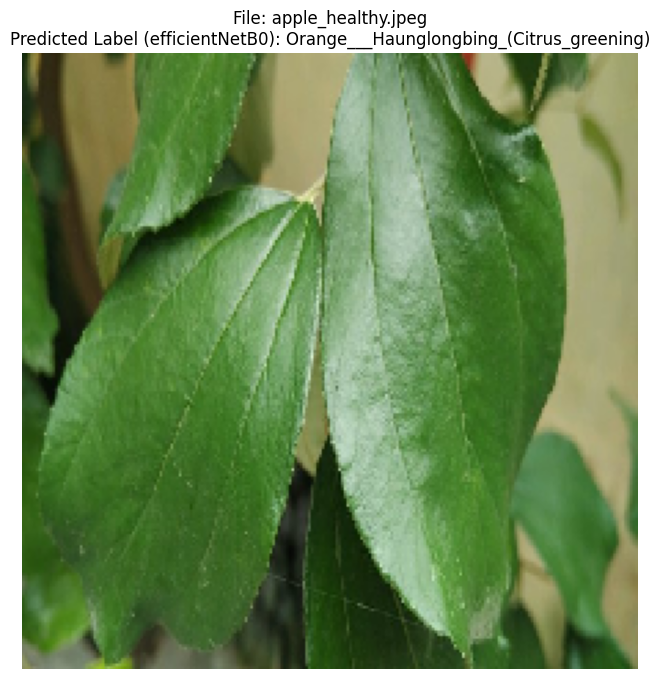

File: apple_healthy.jpeg, Predicted Label (Vgg16): 10
File: apple_healthy.jpeg, Predicted Label (ResNet101V2): 0
File: apple_healthy.jpeg, Predicted Label (MobileNetV2): 1
File: apple_healthy.jpeg, Predicted Label (InceptionV3): 1
File: apple_healthy.jpeg, Predicted Label (InceptionResNetV2): 1
File: apple_healthy.jpeg, Predicted Label (efficientNetB0): 16


In [8]:
test_dir = '/content/drive/MyDrive/test_images'

test_files = os.listdir(test_dir)


test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=1,
    class_mode=None,
    shuffle=False
)


for i, test_file in enumerate(test_files):

    img = load_img(os.path.join(test_dir, test_file), target_size=(224, 224))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)


    vgg16_predict = vgg16.predict(img_array)
    ResNet101V2_predict = ResNet101V2.predict(img_array)
    MobileNetV2_predict = MobileNetV2.predict(img_array)
    InceptionV3_predict = InceptionV3.predict(img_array)
    InceptionResNetV2_predict = InceptionResNetV2.predict(img_array)




    predicted_label_vgg16 = np.argmax(vgg16_predict, axis=1)[0]
    predicted_label_ResNet101V2 = np.argmax(ResNet101V2_predict, axis=1)[0]
    predicted_label_MobileNetV2 = np.argmax(MobileNetV2_predict, axis=1)[0]
    predicted_label_InceptionV3 = np.argmax(InceptionV3_predict, axis=1)[0]
    predicted_label_InceptionResNetV2 = np.argmax(InceptionResNetV2_predict, axis=1)[0]


    class_name_vgg16 = class_names[predicted_label_vgg16]
    class_name_ResNet101V2 = class_names[predicted_label_ResNet101V2]
    class_name_MobileNetV2 = class_names[predicted_label_MobileNetV2]
    class_name_InceptionV3 = class_names[predicted_label_InceptionV3]
    class_name_InceptionResNetV2 = class_names[predicted_label_InceptionResNetV2]
   




    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"File: {test_file}\nPredicted Label (Vgg16): {class_name_vgg16}")
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"File: {test_file}\nPredicted Label (ResNet101V2): {class_name_ResNet101V2}")
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"File: {test_file}\nPredicted Label (MobileNetV2): {class_name_MobileNetV2}")
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"File: {test_file}\nPredicted Label (InceptionV3): {class_name_InceptionV3}")
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"File: {test_file}\nPredicted Label (InceptionResNetV2): {class_name_InceptionResNetV2}")
    plt.axis('off')
    plt.show()


    print(f"File: {test_file}, Predicted Label (Vgg16): {predicted_label_vgg16}")
    print(f"File: {test_file}, Predicted Label (ResNet101V2): {predicted_label_ResNet101V2}")
    print(f"File: {test_file}, Predicted Label (MobileNetV2): {predicted_label_MobileNetV2}")
    print(f"File: {test_file}, Predicted Label (InceptionV3): {predicted_label_InceptionV3}")
    print(f"File: {test_file}, Predicted Label (InceptionResNetV2): {predicted_label_InceptionResNetV2}")

